# Supervised Learning - Classification Using Logistic Regression

## What Is Logistic Regression?

In the previous class, we learned about linear regression and how you can use it to predict future values. <br>
Now we will learn <b>another supervised machine learning algorithm—logistic regression.</b><br>
Unlike linear regression, logistic regression does not try to predict the value of a numeric variable given a set of inputs. Instead, <b>the output of logistic regression is the probability of a given input point belonging to a specific class.</b> <br>
The output of logistic regression always lies in <b> [0,1]</b>.

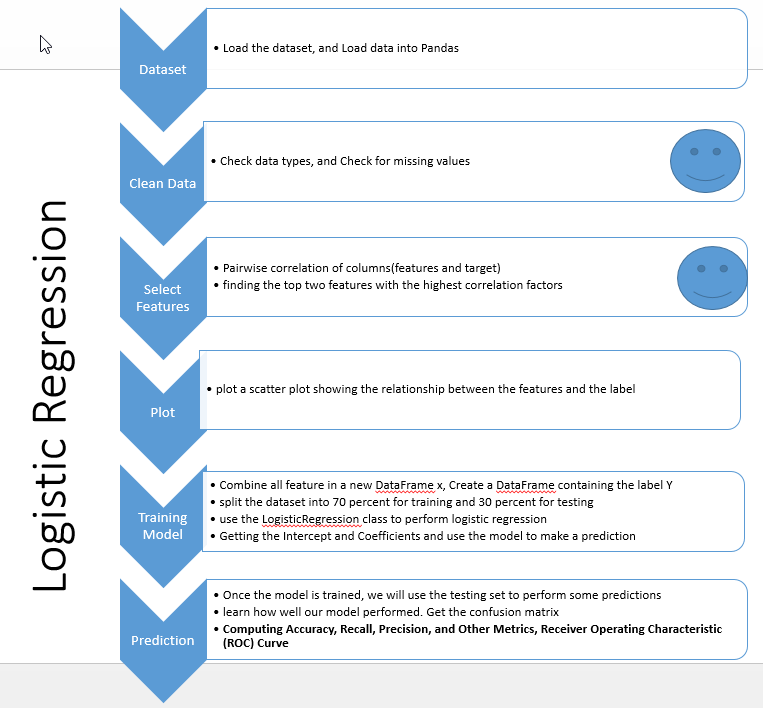

In [2]:
from IPython.display import Image
Image(filename='logisticRegression.png')

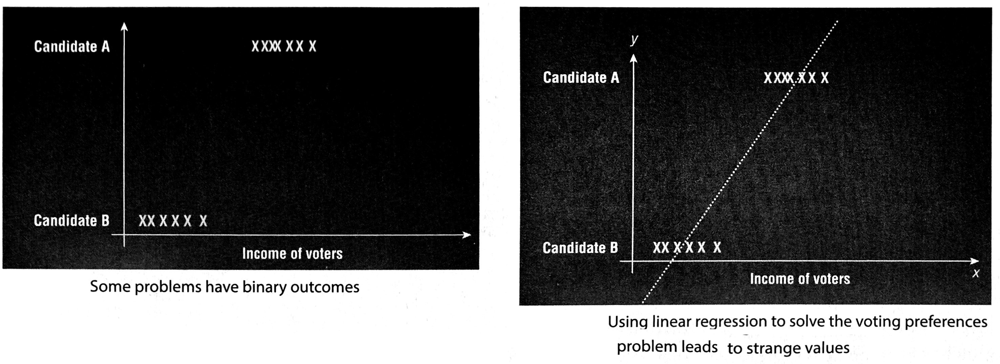

In [3]:
from IPython.display import Image
Image(filename='fig1.png')

To understand <b>the use of logistic regression,</b> consider the example shown in Figure top-left. <br>
Suppose that you have a dataset containing information about <b>voter income and voting preferences.</b><br>
For this dataset, you can see that low—income voters tend to vote for candidate B, while high-income voters tend to favor candidate A.

With this dataset, you would be very interested in <b> trying to predict which candidate future voters will vote for based on their income level.</b><br>
At first glance, you might be tempted to apply what you have just learned to this problem; that is, using <b>linear regression.</b> Figure above top-right shows what it looks like when you apply linear regression to this problem.

<b>The main problem with linear regression is that the predicted value does not always fall within the expected range.</b><br> 
Consider the case of a very low-income voter (near to O), and you can see from the chart that the predicted result is a negative value. <b>What you really want is a way to return the prediction as a value from O to 1, where this value represents the probability of an event happening.</b>

Figure below shows how <b>logistic regression solves this problem</b>. Instead of drawing a straight line cutting through the points, you <b>now use a curved line to try to fit all of the points on the chart</b>.<br>
<br>
Using logistic regression, the output will be a value from 0 to 1, where anything less than (or equal to) 0.5 (known as the <b>threshold</b>) will be considered as voting for candidate B, and anything greater than 0.5 will be considered as voting for candidate A.

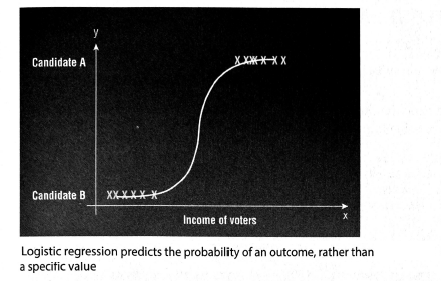

In [4]:
from IPython.display import Image
Image(filename='fig3.png')

## Understanding Odds

Before we discuss the details of the logistic regression algorithm, we first need to discuss one important term: <i>odds</i>. <b>Odds</b> are defined as the <b>ratio of the probability of success to the probability of failure</b> (see Figure below).

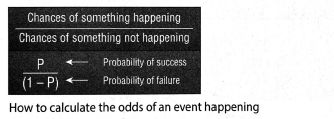

In [5]:
from IPython.display import Image
Image(filename='fig4.png')

For example, the odds of landing a head when you flip a coin are 1. <br>
This is because you have a 0.5 probability of landing a head and a 0.5 probability of landing a tail. <b>When you say that the odds of landing a head are 1, this means you have a 50 percent chance of landing a head.</b>

But if the <b>coin is rigged</b> in such a way that the probability of landing a head is 0.8 and the probability of landing a tail is 0.2, then the odds of landing a head is 0.8/0.2 = 4. That is, you are 4 times more likely to land a head than a tail.<br>
Likewise, the odds of getting a tail are 0.2/0.8 = 0.25.

## Logit Function

When you apply the natural logarithm function to the odds, you get the logit
function. <b>The logit function is the logarithm of the odds</b> (see Figure below).

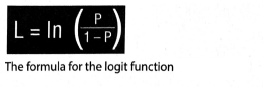

In [6]:
from IPython.display import Image
Image(filename='fig5.png')

The logit function transfers a variable on (0, 1) into a new variable on (-oo, oo) (minus infinite, infinite)<br>
To see this relationship, you can use the following code snippet:

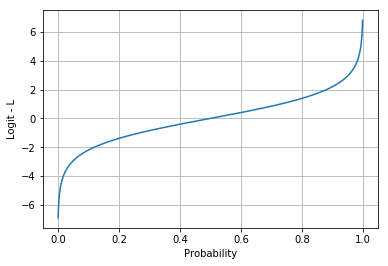

In [7]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def logit(x):
    return np.log( x / (1 - x) )

x = np.arange(0.001,0.999, 0.0001)
y = [logit(n) for n in x]
plt.plot(x,y)
plt.xlabel("Probability")
plt.ylabel("Logit - L")
plt.grid(True)

## Sigmoid Curve

For the logit curve, observe that the <b>x-axis is the probability and the y—axis is the real-number range</b>. For logistic  regression, what you really want is a function that <b>maps numbers on the real-number system to the probabilities</b>, which is exactly what you get when you <b>flip the axes of the logit curve</b> (see Figure below).

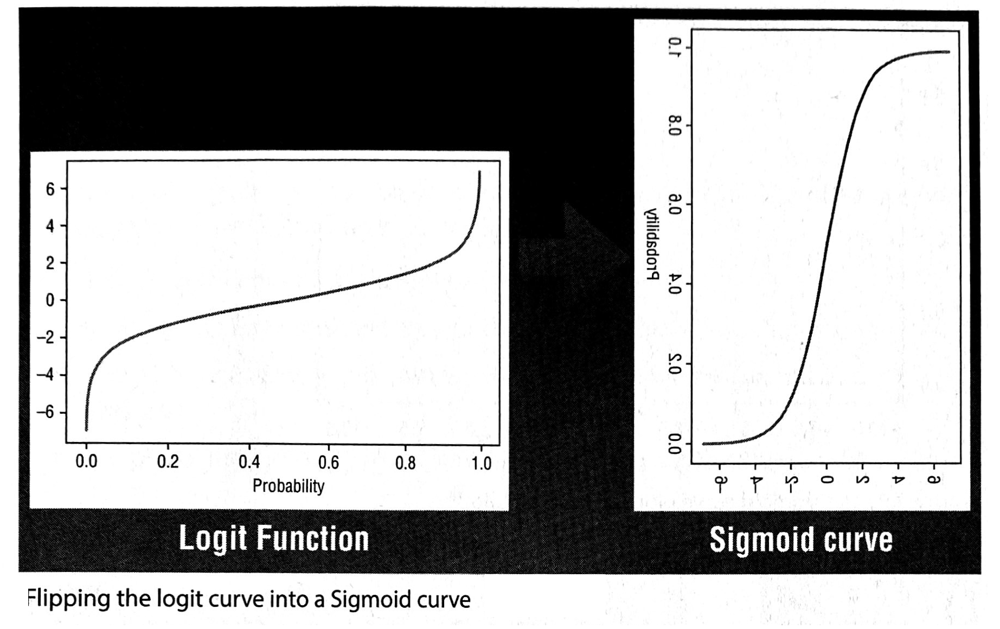

In [8]:
from IPython.display import Image
Image(filename='fig7.png')

When you flip the axes, the curve that you get is called the <b>sigmoid curve.</b> <br>
The sigmoid curve is obtained using the <b>Sigmoid function</b>, which is the inverse of the logit function. The Sigmoid function is used to transform values on (—00, 00) into numbers on (0, 1). The Sigmoid function is shown in Figure below.

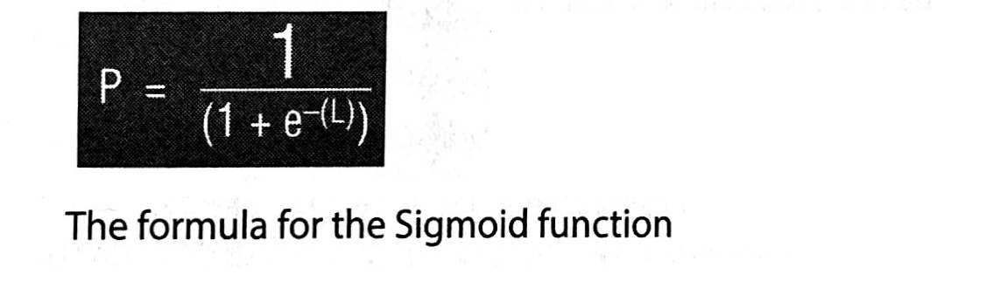

In [9]:
from IPython.display import Image
Image(filename='fig8.png')

The following code snippet shows how the <b>sigmoid curve</b> is obtained:

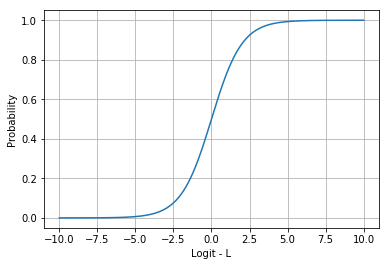

In [10]:
def sigmoid(x):
    return (1 / (1 + np.exp(-x)))

x = np.arange(-10, 10, 0.0001)
y = [sigmoid(n) for n in x]
plt.plot(x,y)
plt.xlabel("Logit - L")
plt.ylabel("Probability")
plt.grid(True)

Figure above shows the sigmoid curve.
Just like you try to plot a straight line that fits through all of the points in linear regression (as explained before), <b>in logistics regression, we would also like to plot a sigmoid curve that fits through all of the points.</b><br> Mathematically, this can be expressed by the formula shown in Figure below

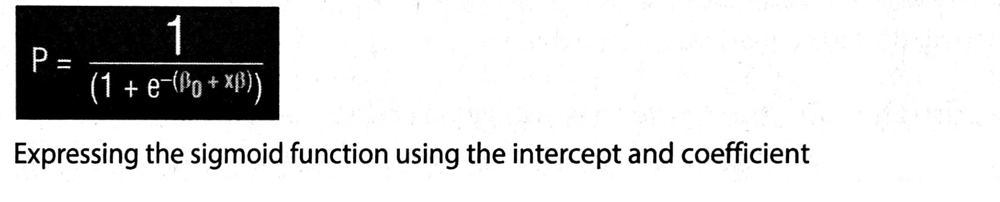

In [11]:
from IPython.display import Image
Image(filename='fig10.png')

Notice that the key difference between the formula shown above and the one before is that now L has been replaced by B0 and xB. <br>
The coefficients B0 and xB are unknown, and they must be estimated based on the available training data using a technique known as <b>Maximum Likelihood Estimation (MLE).</b><br>
In logistics regression,<b> BO is known as the intercept and x0 is known as the coefficient.</b>

# Using the Breast Cancer Wisconsin (Diagnostic) Data Set

Scikit-learn ships with the Breast Cancer Wisconsin (Diagnostic) Data Set. It is a classic dataset that is often <b>used to illustrate binary classifications.</b> <br>
This dataset <b>contains 30 features</b>, and they are computed from a <b>digitized image of a fine needle aspirate (FNA) of a breast mass</b>.
<br>The label of the dataset is a binary classification — <b>M for malignant or B for benign.</b><br><br> Interested readers can check out more information at https://archive.ics.uci.edu/ml/datasets/Breast+
Cancer+Wisconsin+(Diagnostic).

## Examining the Relationship Between Features

You can load the Breast Cancer dataset by first importing the datasets module from <b>sklearn</b>. Then use the load _ breast _ cancer() function as follows:

<b><i>from sklearn.datasets import load_breast_cancer<br>
cancer = load_breast_cancer()</i></b>

Now that the Breast Cancer dataset has been loaded, it is useful to <b>examine the relationships between some of its features.</b>

## Plotting the Features in 2D 

For a start, let’s <b>plot the first two features of the dataset in 2D and examine their relationships</b>. The following code snippet:
- Loads the Breast Cancer dataset
- Copies the first two features of the dataset into a two-dimensional list
- Plots a scatter plot showing the distribution of points for the two features
- Displays malignant growths in red and benign growths in blue

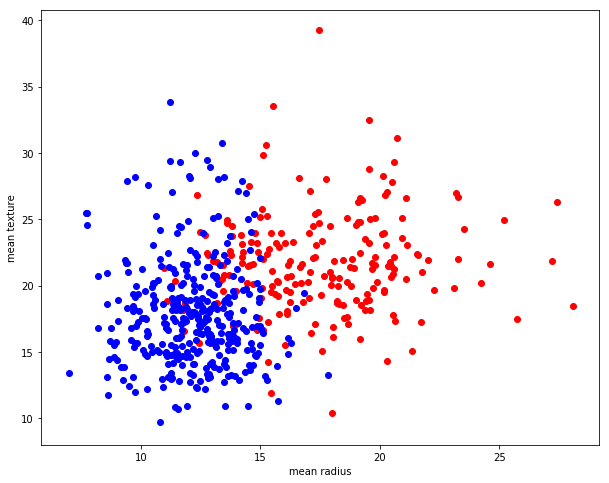

In [12]:
%matplotlib inline

import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

#---copy from dataset into a 2-d list---
X = []
for target in range(2):
    X.append([[], []])
    for i in range(len(cancer.data)):              # target is 0 or 1
        if cancer.target[i] == target:
            X[target][0].append(cancer.data[i][0]) # first feature - mean radius
            X[target][1].append(cancer.data[i][1]) # second feature — mean texture

colours = ("r", "b")   # r: malignant, b: benign
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
for target in range(2):
    ax.scatter(X[target][0],
               X[target][1],
               c=colours[target])

ax.set_xlabel("mean radius")
ax.set_ylabel("mean texture")
plt.show()


The above is the <b>scatter plot showing the relationships between the mean radius and mean texture of the tumor.</b><br>
From this scatter plot, you can gather that <b>as the tumor grows in radius and increases in texture, the more likely that it would be diagnosed as malignant.</b>

## Plotting in 3D

In the previous section, you plotted the points based on two features using a scatter plot. <b>It would be interesting to be able to Visualize more than two features.</b><br>
In this case, let’s try to Visualize the relationships between three features.<br>
You can use matplotlib to plot a 3D plot. The following code snippet shows how this is done. It is very similar to the code snippet in the previous section, with the additional statements:

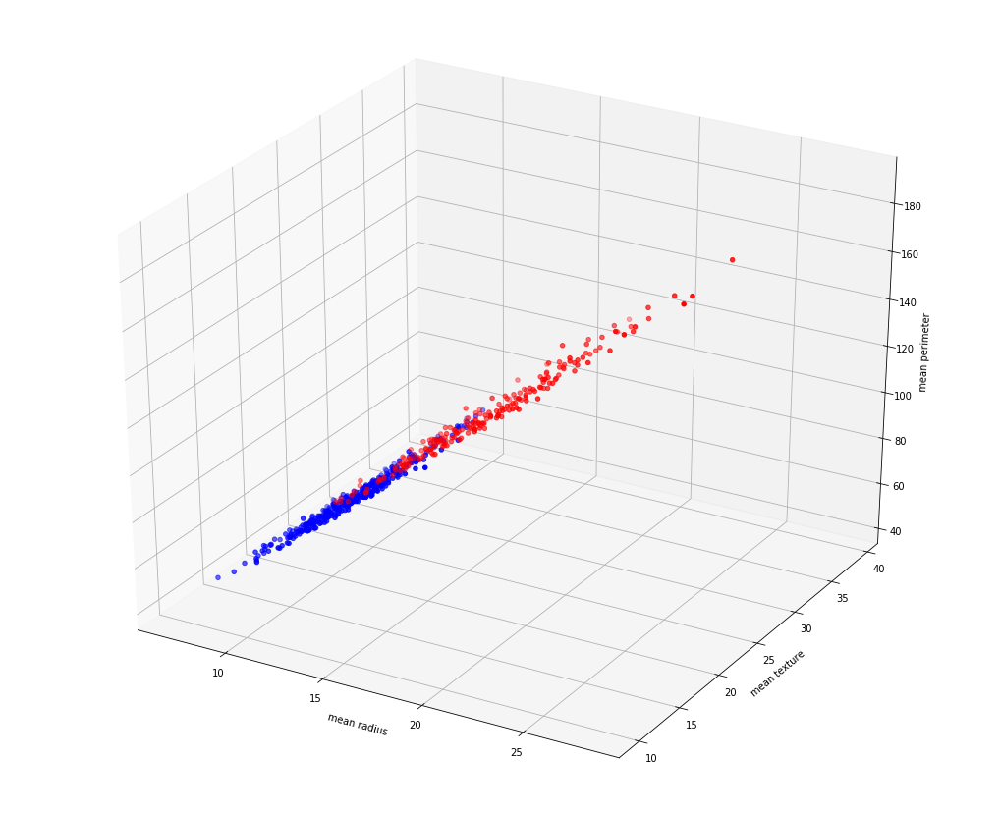

In [13]:
%matplotlib inline

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

#---copy from dataset into a 2-d array---
X = []
for target in range(2):
    X.append([[], [], []])
    for i in range(len(cancer.data)):    # target is 0,1
        if cancer.target[i] == target:
            X[target][0].append(cancer.data[i][0])
            X[target][1].append(cancer.data[i][1])
            X[target][2].append(cancer.data[i][2])

colours = ("r", "b")   # r: malignant, b: benign
fig = plt.figure(figsize=(18,15))
ax = fig.add_subplot(111, projection='3d')
for target in range(2):
    ax.scatter(X[target][0],
               X[target][1],
               X[target][2],
               c=colours[target])

ax.set_xlabel("mean radius")
ax.set_ylabel("mean texture")
ax.set_zlabel("mean perimeter")
plt.show()


# Exercises
---

Jupyter Notebook displays the 3D plot statically. As you can see from Figure above, you can’t really have a good look at the relationships between the three features.<br>
A much better way to display the 3D plot would be to run the preceding code
snippet outside of Jupyter Notebook. To do so, <b>save the code snippet (minus the first line containing the statement "%matplotlib inline”) to a file named, say, 3dplot.py. Then run the file in Terminal using the python command, as follows:</b> <br><br>
$ python 3dplot.py
<br><br>
Once you do that, matplotlib will open a separate window to display the 3D
plot. Best of all, you will be able to interact with it. <b>Use your mouse to drag the plot, and you are able to Visualize the relationships better between the three features.</b> The result is a Figure that gives you a better perspective: as the mean perimeter of the tumor growth increases, the chance of the growth bem'g malignant also increases.

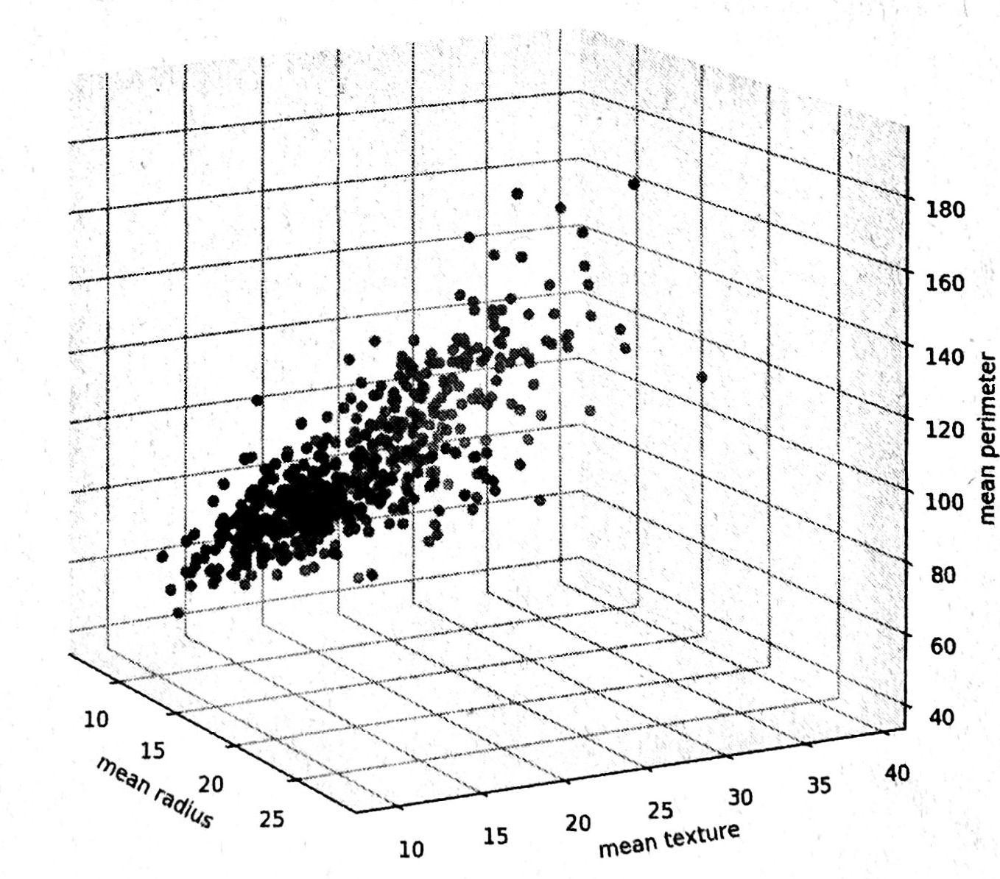

In [14]:
from IPython.display import Image
Image(filename='fig13.png')

1. Try the above in a python file.

## Training Using One Feature

Let’s now use logistic regression to try to <b>predict if a tumor is cancerous.</b> To get started, let’s <b>use only the first feature of the dataset: mean radius.</b> The following code snippet plots a scatter plot showing if a tumor is malignant or benign based on the mean radius:

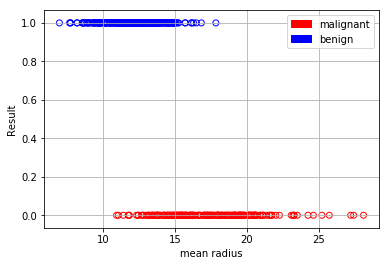

In [15]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()   # Load dataset
x = cancer.data[:,0]            # mean radius
y = cancer.target               # 0: malignant, 1: benign
colors = {0:'red', 1:'blue'}    # 0: malignant, 1: benign

plt.scatter(x,y,
            facecolors='none',
            edgecolors=pd.DataFrame(cancer.target)[0].apply(lambda x: colors[x]),
            cmap=colors)

plt.xlabel("mean radius")
plt.ylabel("Result")

red   = mpatches.Patch(color='red',   label='malignant')
blue  = mpatches.Patch(color='blue',  label='benign')

plt.legend(handles=[red, blue], loc=1)
plt.grid(True)

As you can see, this is a <b>good opportunity to use logistic regression to predict if a tumor is cancerous.</b> You could try to plot an "s" curve (albeit flipped horizontally).

### Finding the Intercept and Coefficient

Scikit—learn comes with the <b>LogisticRegression class</b> that allows you to apply logistic regression to train a model. Thus, in this example, you are going to <b>train a model using the first feature of the dataset</b>:

In [16]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
from sklearn import linear_model
import numpy as np

log_regress = linear_model.LogisticRegression()

#---train the model---
log_regress.fit(X = np.array(x).reshape(len(x),1),
                y = y)

#---print trained model intercept---
print(log_regress.intercept_)     # [ 8.19393897]

#---print trained model coefficients---
print(log_regress.coef_)          # [[-0.54291739]]


[8.19393897]
[[-0.54291739]]


Once the model is trained, what we are most interested in at this point is
the intercept and coefficient.
<br> If you recall from the last formula, <b>the intercept is B0 and the coefficient is xB.</b> Knowing these two values allows us to <b>plot the sigmoid curve that tries to fit the points on the chart.</b>

### Plotting the Sigmoid Curve

<b>With the values of BO and xB obtained, you can now plot the sigmoid curve</b> using the following code snippet:

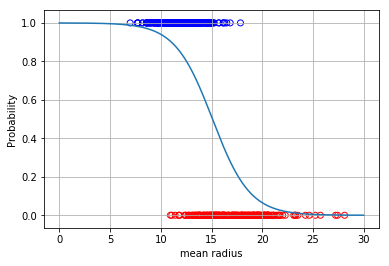

In [17]:
def sigmoid(x):
    return (1 / (1 +
        np.exp(-(log_regress.intercept_[0] +
        (log_regress.coef_[0][0] * x)))))

x1 = np.arange(0, 30, 0.01)
y1 = [sigmoid(n) for n in x1]

plt.scatter(x,y,
    facecolors='none',
    edgecolors=pd.DataFrame(cancer.target)[0].apply(lambda x: colors[x]),
    cmap=colors)

plt.plot(x1,y1)
plt.xlabel("mean radius")
plt.ylabel("Probability")
plt.grid(True)

### Making Predictions

Using the trained model, lest try to make some predictions. Let's try to predict the result if the mean radius is 20.

In [18]:
meanR1 = np.array(20).reshape(-1, 1)
print(log_regress.predict_proba(meanR1)) # [[0.93489354 0.06510646]]

[[0.93489354 0.06510646]]


In [19]:
print(log_regress.predict(meanR1)[0])    # 0

0


In [20]:
meanR2 = np.array(8).reshape(-1, 1)
print(log_regress.predict_proba(meanR2))  # [[0.02082411 0.97917589]]

[[0.02082411 0.97917589]]


In [21]:
print(log_regress.predict(meanR2)[0])     # 1

1


## Training the Model Using All Features

In the previous section, you specifically trained the model using one feature.<br>
Let’s <b>now try to train the model using all of the features and then see how well it can accurately perform the prediction.</b><br>
First, load the dataset:

In [22]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()        # Load dataset


Instead of training the model using all of the rows in the dataset, <b>you are going to split it into two sets, one for training and one for testing.</b> To do so, you use the train _ test _ split( ) function. This function allows you to split your data into random train and test subsets. <br><br>The following code snippet splits the dataset into a 75 percent training and 25 percent testing set:

In [23]:
from sklearn.model_selection import train_test_split
train_set, test_set, train_labels, test_labels = train_test_split(
                              cancer.data,               # features
                              cancer.target,             # labels
                              test_size = 0.25,          # split ratio
                              random_state = 1,          # set random seed
                              stratify = cancer.target)  # randomize based on labels


Figure below shows how the dataset is split.

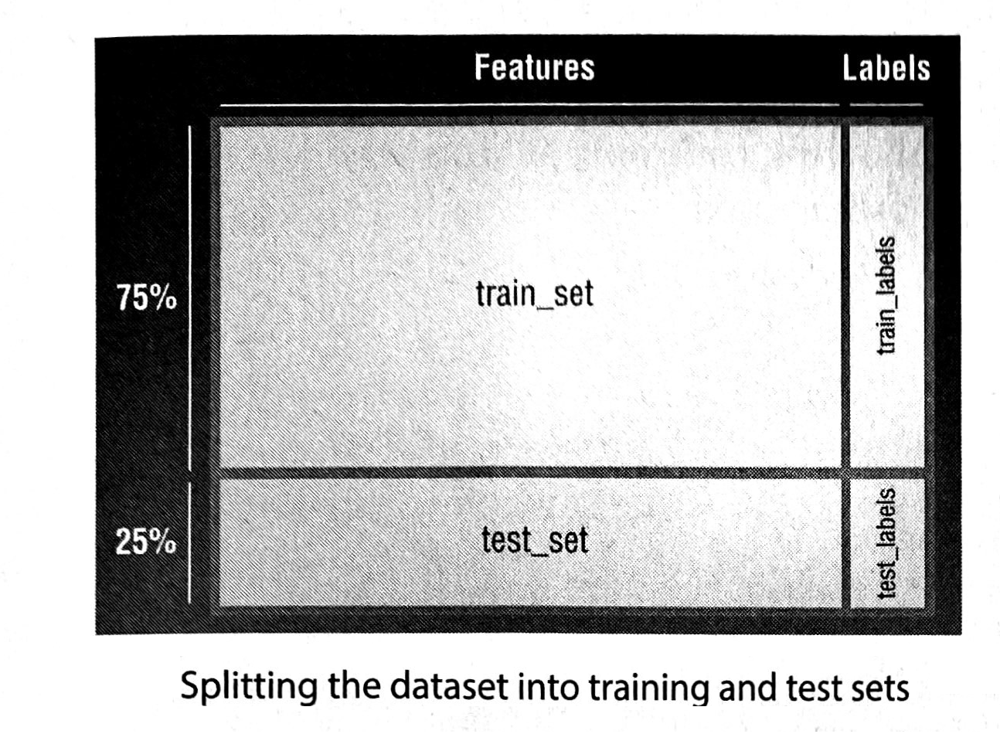

In [24]:
from IPython.display import Image
Image(filename='fig16.png')

<b>The random _ state parameter of the train _ test _ split() function specifies the seed used by the random number generator.</b> <br>
If this is not specified, every time you run this function you will get a different training and testing set. <b>The stratify parameter</b> allows you to specify which column (feature/label) to use <b>so that the split is proportionate.</b><br>
For example, if the column specified is a categorical variable with 80 percent Os and 20 percent ls, then the training and test sets would each have 80 percent of 0s and 20 percent of 1s.

<b>Once the dataset is split, it is now time to train the model. The following code snippet trains the model using logistic regression:</b>

In [25]:
from sklearn import linear_model
x = train_set[:,0:30]         # mean radius
y = train_labels              # 0: malignant, 1: benign
log_regress = linear_model.LogisticRegression()
log_regress.fit(X = x,
                y = y)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In this example, we are training it with all of the 30 features in the dataset.<br>
When the training is done, let’s print out the intercept and model coefficients:

In [26]:
print(log_regress.intercept_)     #
print(log_regress.coef_)          #


[0.34532169]
[[ 1.80108727e+00  2.55720211e-01 -3.76204807e-02 -5.89113357e-03
  -9.58006168e-02 -3.16738129e-01 -5.06734997e-01 -2.53232116e-01
  -2.26194805e-01 -1.03691790e-02  4.04343491e-03  9.76683313e-01
   2.02746714e-01 -1.22291266e-01 -8.25606209e-03 -1.41126808e-02
  -5.49927377e-02 -3.33043267e-02 -3.05719589e-02  1.13150930e-04
   1.62879920e+00 -4.35008681e-01 -1.50278281e-01 -2.32821868e-02
  -1.94396888e-01 -9.91493438e-01 -1.42897382e+00 -5.40802403e-01
  -6.28813743e-01 -9.04920075e-02]]


Because we have trained the model using 30 features, there are 30 coefficients.

### Testing the Model

<b>It’s time to make a prediction<b>.<br>
The following code snippet uses the test set and feeds it into the model to obtain the predictions:

In [29]:
import pandas as pd

#---get the predicted probablities and convert into a dataframe---
preds_prob = pd.DataFrame(log_regress.predict_proba(X=test_set))

#---assign column names to prediction---
preds_prob.columns = ["Malignant", "Benign"]

#---get the predicted class labels---
preds = log_regress.predict(X=test_set)
preds_class = pd.DataFrame(preds)
preds_class.columns = ["Prediction"]

#---actual diagnosis---
original_result = pd.DataFrame(test_labels)
original_result.columns = ["Original Result"]

#---merge the three dataframes into one---
result = pd.concat([preds_prob, preds_class, original_result], axis=1)
print(result.head())

   Malignant        Benign  Prediction  Original Result
0   0.999812  1.881568e-04           0                0
1   0.998357  1.642846e-03           0                0
2   0.057985  9.420153e-01           1                1
3   1.000000  9.693663e-08           0                0
4   0.207271  7.927292e-01           1                0


The results of the predictions are then printed out. <b>The predictions and original diagnosis are displayed side-by—side for easy comparison:</b>

### Getting the Confusion Matrix

While it is useful to print out the predictions together with the original diagnosis from the test set, <b>it does not give you a clear picture of how good the model is in predicting if a tumor is cancerous</b>.
<br> A more scientific way would be to use the <b>confusion matrix.</b> 
<br>The confusion matrix shows the <b>number of actual and predicted labels and how many of them are classified correctly.</b>
<br> You can <b>use Pandas’s crosstab() function</b> to print out the confusion matrix:

The <b>crosstab() function computes a simple cross-tabulation of two factors.</b><br>
The preceding code snippet prints out the following:

In [30]:
#---generate table of predictions vs actual---
print("---Confusion Matrix---")
print(pd.crosstab(preds, test_labels))

---Confusion Matrix---
col_0   0   1
row_0        
0      48   3
1       5  87


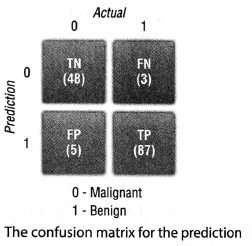

In [31]:
from IPython.display import Image
Image(filename='fig17.png')

The columns represent the actual diagnosis (0 for malignant and 1 for benign).
The rows represent the prediction. Each individual box represents one of the
following:<br>
- <b>True Positive (TP):</b> The model correctly predicts the outcome as positive. In this example, the number of TP (87) indicates the number of correct predictions that a tumor is benign.<br>
- <b>True Negative (TN):</b> The model correctly predicts the outcome as negative.
In this example, tumors were correctly predicted to be malignant.<br>
- <b>False Positive (PP):</b> The model incorrectly predicted the outcome as positive, but the actual result is negative. In this example, it means that the tumor is actually malignant, but the model predicted the tumor to be benign.<br>
- <b>False Negative (FN):</b> The model incorrectly predicted the outcome as negative, but the actual result is positive. In this example, it means that the tumor is actually benign, but the model predicted the tumor to be malignant.<br>
This set of numbers is known as the <b>confusion matrix.<b>

Besides using the crosstab() function, you can also use the <b>confusion
matrix() function to print out the confusion matrix:</b>

In [32]:
from sklearn import metrics
#---view the confusion matrix---
print(metrics.confusion_matrix(y_true = test_labels,  # True labels
                               y_pred = preds))       # Predicted labels

#Note that the output is switched for the rows and columns.

[[48  5]
 [ 3 87]]


### Computing Accuracy, Recall, Precision, and Other Metrics

<b>Based on the confusion matrix<b>, you can calculate the following metrics:

- <b>Accuracy:</b> This is defined as the sum of all correct predictions divided by the total number of predictions, or mathematically:
(TP / TN) / (TP + TN + FP + FN)<br>
This metric is easy to understand. After all, if the model correctly predicts
99 out of 100 samples, the accuracy is 0.99, which would be very impressive
in the real world. <br>
But consider the following situation: Imagine that you’re trying to predict the failure of equipment based on the sample data. Out of 1,000 samples, only three are defective. If you use a dumb <b> algorithm that always returns negative (meaning no failure) for all results</b>, then the accuracy is 997/1000, which is 0.997. This is very impressive, <b>but does this mean it’s a good algorithm? No.</b> <br>
If there are 500 defective items in the dataset of 1,000 items, then the accuracy metric immediately indicates the flaw of the algorithm. 
<br>In short, accuracy works best with <b>evenly distributed data points,</b> but it works <b>really badly for a skewed dataset.</b><br>
Figure below summarizes the formula for accuracy.

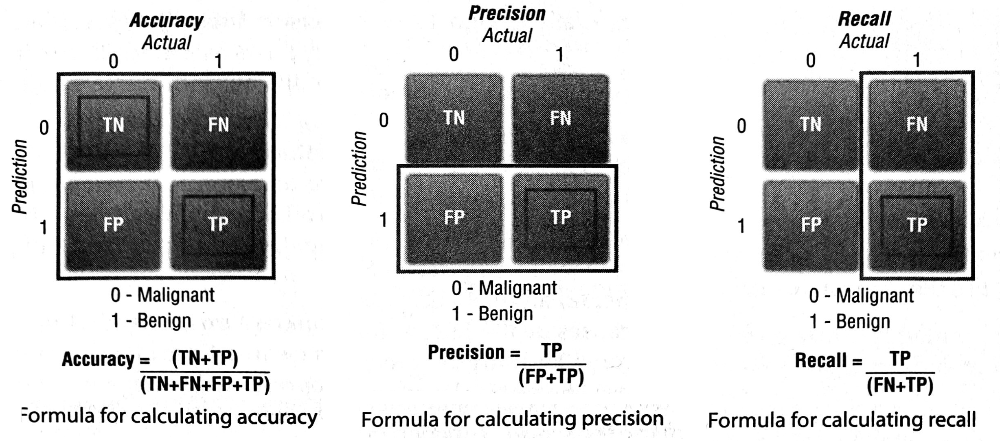

In [33]:
from IPython.display import Image
Image(filename='fig18.png')

- <b>Precision:</b> This metric is defined to be <b>TP / (TP + FP).</b> This metric is
concerned with <b>number of correct positive predictions. </b><br>
You can think of precision as "of those predicted to be positive, how many were actually predicted correctly?"
<br> The figure above summarizes the formula for precision.

- <b>Recall</b> (also known as <b>True Positive Rate (TPR)</b>): This metric is defined to be <b>TP / (TP + FN).</b> This metric is concerned with the <b>number of correctly predicted positive events.</b> <br>
You can think of recall as "of those positive events, how many were predicted correctly?" Figure above summarizes the formula for recall.

- <b>F1 Score:</b> This metric is defined to be 2 * (precision * recall) / (precision + recall).<br> 
This is known as the harmonic mean of precision and recall, and it
is a <b>good way to summarize the evaluation of the algorithm in a single
number.</b>


- <b>False Positive Rate (PPR):</b> This metric is defined to be FP / (FP+TN). FPR corresponds to <b>the proportion of negative data points that are mistakenly considered as positive, with respect to all negative data points.</b><br>
In other words, the higher FPR, the more negative data points you’ll
misclassify.

The concept of <b>precision and recall</b> may not be apparent immediately, but if you consider the following scenario, it will be much clearer. <br>
Consider the case of <b>breast cancer diagnosis.</b><br>
If a malignant tumor is represented as negative and a benign tumor is represented as positive, then:
<br>
- If the precision or recall is high, it means that more patients with benign
tumors are diagnosed correctly, which indicates that the algorithm is good.<br>
- If the precision is low, it means that more patients with malignant tumors are diagnosed as benign.<br>
- If the recall is low, it means that more patients with benign tumors are diagnosed as malignant. <br>
For the last two points, having a low precision is more serious than a low
recall (although wrongfully diagnosed as having breast cancer when you do not
have it will likely result in unnecessary treatment and mental anguish) because
it causes the patient to miss treatment and potentially causes death. <b>Hence, for cases like diagnosing breast cancer, it’s important to consider both the precision and recall metrics when evaluating the effectiveness of an ML algorithm.</b><br><br>
<b>To get the accuracy</b> of the model, you can <b>use the score ( ) function</b> of the model:

In [34]:
#---get the accuracy of the prediction---
print("---Accuracy---")
print(log_regress.score(X = test_set ,
                        y = test_labels))

---Accuracy---
0.9440559440559441


<b>To get the precision, recall, and F1-score</b> of the model, <b>use the classification _report()</b> function of the metrics module:

In [35]:
# View summary of common classification metrics
print("---Metrices---")
print(metrics.classification_report(
      y_true = test_labels,
      y_pred = preds))

---Metrices---
              precision    recall  f1-score   support

           0       0.94      0.91      0.92        53
           1       0.95      0.97      0.96        90

    accuracy                           0.94       143
   macro avg       0.94      0.94      0.94       143
weighted avg       0.94      0.94      0.94       143



### Receiver Operating Characteristic (ROC) Curve

With so many metrics available, what is an easy way to examine the <b>effectiveness of an algorithm?</b><br>
One way would be to <b>plot a curve known as the Receiver Operating Characteristic (ROC) curve.</b> The ROC curve is created by plotting the TPR against the FPR at various threshold settings.<br><br>
So how does it work? Let’s run through a <b>simple example.</b> Using the existing project that you have been working on, you have derived the <b>confusion matrix based on the default threshold of 0.5 (meaning that all of those predicted probabilities less than or equal to 0.5 belong to one class, while those greater than 0.5 belong to another class).</b> Using this confusion matrix, you then find the <b>recall, precision, and subsequently FPR and TPR.</b><br> 
Once the FPR and TPR are found, you can plot the point on the chart, as shown in the Figure below:

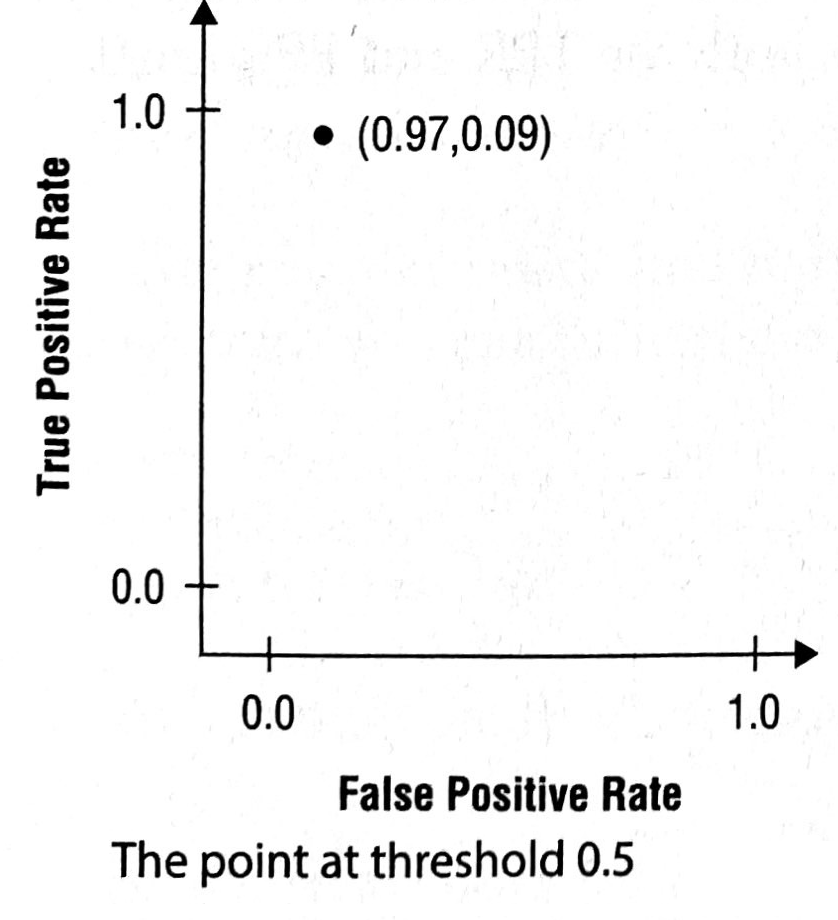

In [81]:
from IPython.display import Image
Image(filename='fig19.png')

Then you regenerate the <b>confusion matrix for a threshold of 0,</b> and recalculate the recall, precision, FPR, and TPR. Using the new FPR and TPR, you plot another point on the chart. You then repeat this process for <b>thresholds of 0.1, 0.2, 0.3, and so on, all the way to 1.0.</b>

<b>At threshold 0</b> in order for a tumor to be classified as <b>benign (1)</b>, the predicted probability must be <b>greater than 0.</b> Hence, <b>all of the predictions would be classified as benign (1).</b> Figure below shows how to calculate the TPR and FPR. For a threshold of 0, both the TPR and FPR are 1.

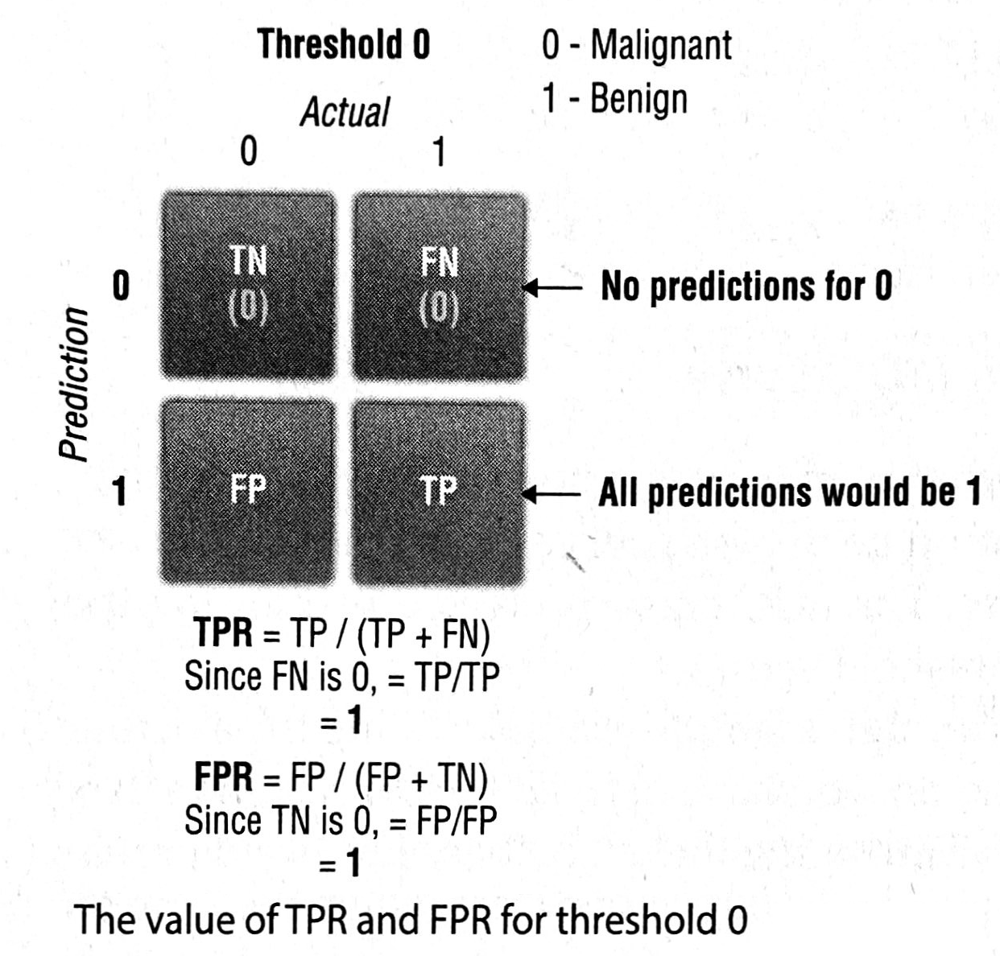

In [82]:
from IPython.display import Image
Image(filename='fig20.png')

<b>At threshold 1.0,</b> in order for a tumor to be classified as <b>benign (1)</b>, the <b>predicted probability</b> must be equal to <b>exactly 1.</b> Hence, <b>all of the predictions would be classified as malignant (0).<b><br>
Figure below shows how to calculate the TPR and FPR when the threshold is 1.0. For a threshold of 1.0, both the TPR and FPR are 0.

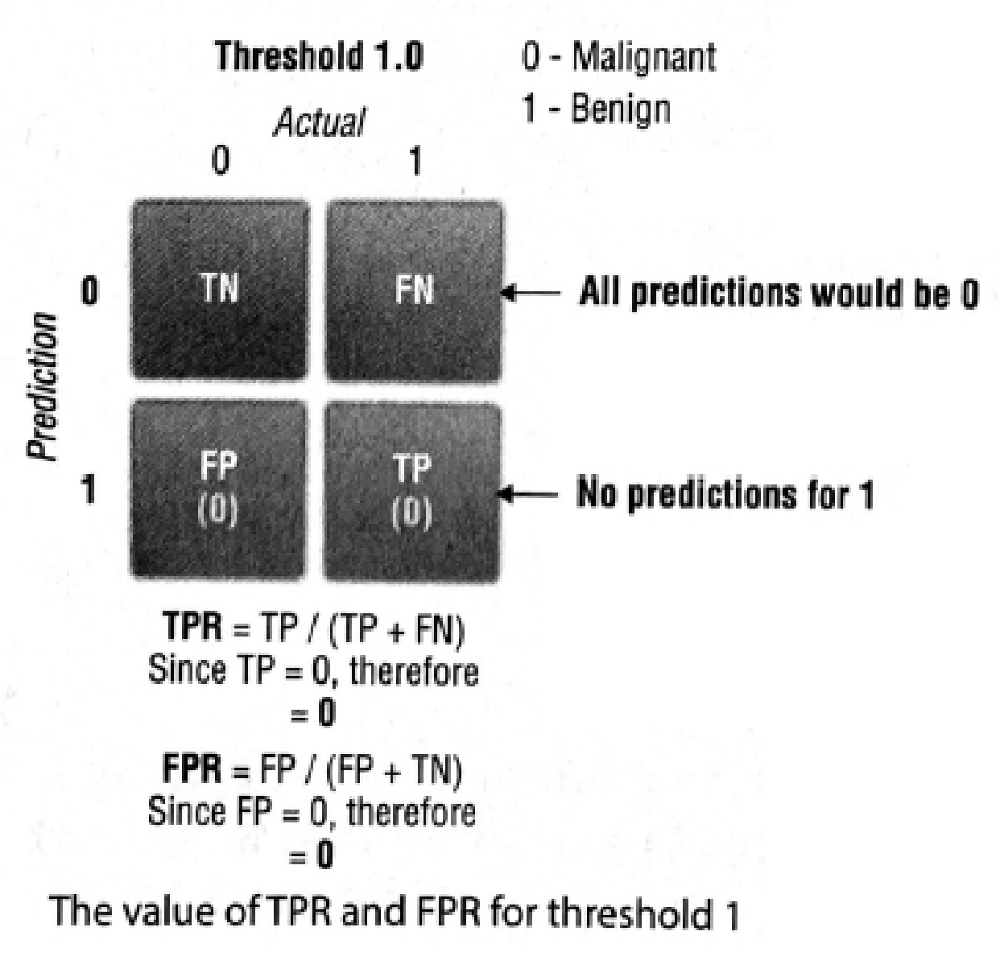

In [83]:
from IPython.display import Image
Image(filename='fig21.png')

We can now plot two more points on our chart (see Figure below).

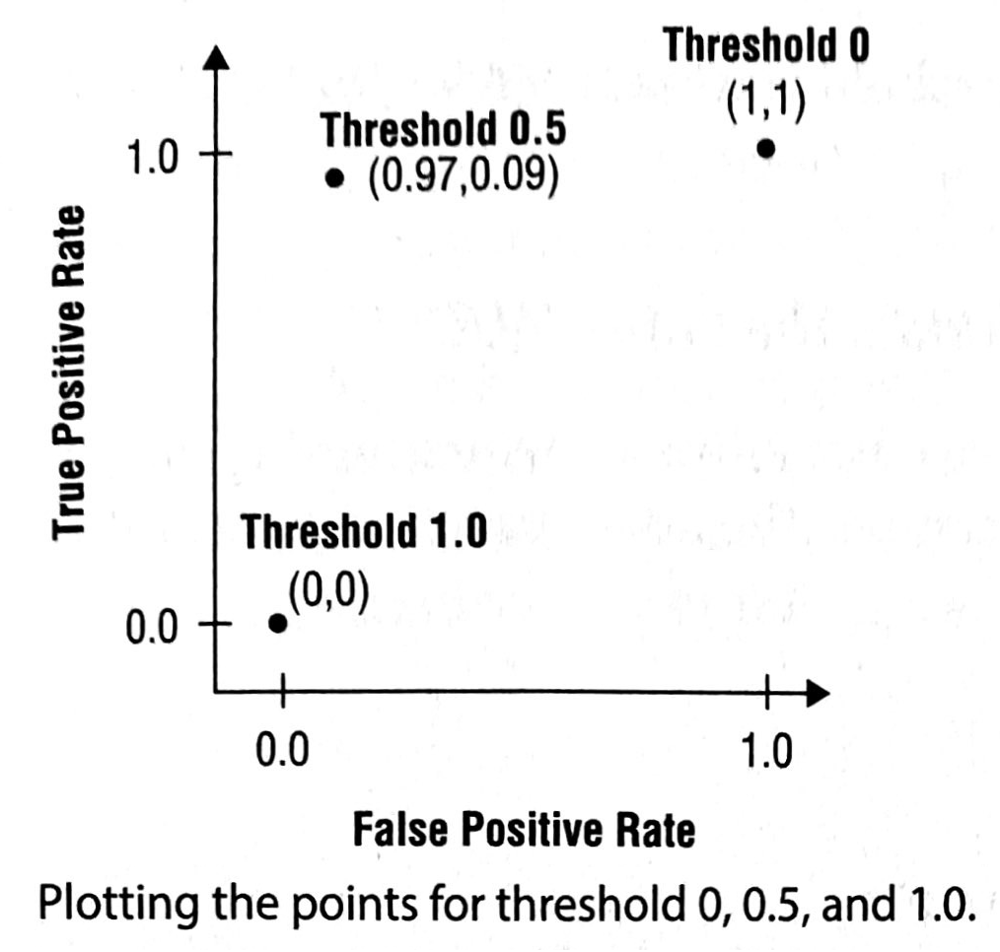

In [84]:
from IPython.display import Image
Image(filename='fig22.png')

You then calculate the metrics for the other threshold values. <b>Calculating
all of the metrics based on different threshold values is a very tedious process.</b><br>
Fortunately, <b>Scikit—learn has the roc _ curve () function</b>, which will calculate the FPR and TPR automatically for you based on the supplied test labels and predicted probabilities:

In [85]:
from sklearn.metrics import roc_curve, auc

#---find the predicted probabilities using the test set
probs = log_regress.predict_proba(test_set)
preds = probs[:,1]

#---find the FPR, TPR, and threshold---
fpr, tpr, threshold = roc_curve(test_labels, preds)


The <b> roc _ curve( ) function </b> returns a tuple containing the FPR, TPR, and threshold. You can print them out to see the values:

In [86]:
print(fpr)
print(tpr)
print(threshold)


[0.         0.         0.         0.01886792 0.01886792 0.03773585
 0.03773585 0.09433962 0.09433962 0.11320755 0.11320755 0.18867925
 0.18867925 1.        ]
[0.         0.01111111 0.88888889 0.88888889 0.91111111 0.91111111
 0.94444444 0.94444444 0.96666667 0.96666667 0.98888889 0.98888889
 1.         1.        ]
[1.99999108e+00 9.99991085e-01 9.36986766e-01 9.18007138e-01
 9.03175845e-01 8.58506462e-01 8.48214432e-01 5.43427129e-01
 5.26012253e-01 3.72042852e-01 2.71089172e-01 1.21482959e-01
 1.18610631e-01 1.31056703e-21]


As you can see from the output, <b>the threshold starts at 0.99999 (9.99e-01) and goes down to 1.311e-21.</b>

### Plotting the ROC and Finding the Area Under the Curve (AUC)

To plot the ROC, you can use matplotlib to plot a line Chart using the values
stored in the <b>fpr and tpr variables.</b> <br>
You can use the <b>auc ( ) function to</b> find the <b>area under the ROC:</b>

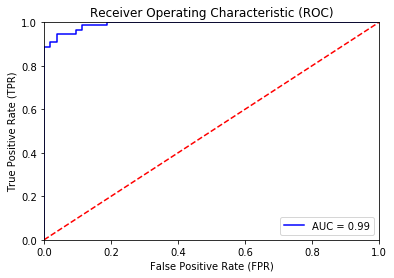

In [87]:
#---find the area under the curve---
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate (TPR)')
plt.xlabel('False Positive Rate (FPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc = 'lower right')
plt.show()


The area under an ROC curve is a <b>measure of the usefulness of a test in
general</b>, where a greater area means a more useful test and the areas under
ROC curves are used to compare the usefulness of tests. Generally, aim for the
algorithm with the highest AUC. Figure above shows the ROC curve as well as the AUC.

## Summary
In this notebook, you learned about <b>another supervised machine learning
algorithm—logistics regression.</b> You first learned about the logit function and how to transform it into a sigmoid function. You then <b>applied the logistic regression to the breast cancer dataset and used it to predict if a tumor is malignant or benign.</b><br>
More importantly, we discussed some of the metrics that are useful in determining the effectiveness of a machine learning algorithm.<br>
In addition, you learned about what an <b>ROC curve</b> is, how to plot it, and how to <b>calculate the area under the curve.</b>